Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
0 [ 6 11 13 13]
Noise AUG
Noise AUG
Noise AUG
Noise AUG
1 [12 10 11  3]
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
2 [14  9 11  4]
on_epoch_end called

 Shuffling Data...
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
0 [11 10 11  6]
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
1 [12 13  9 14]
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
2 [11  3  4 13]


(-0.5, 499.5, 199.5, -0.5)

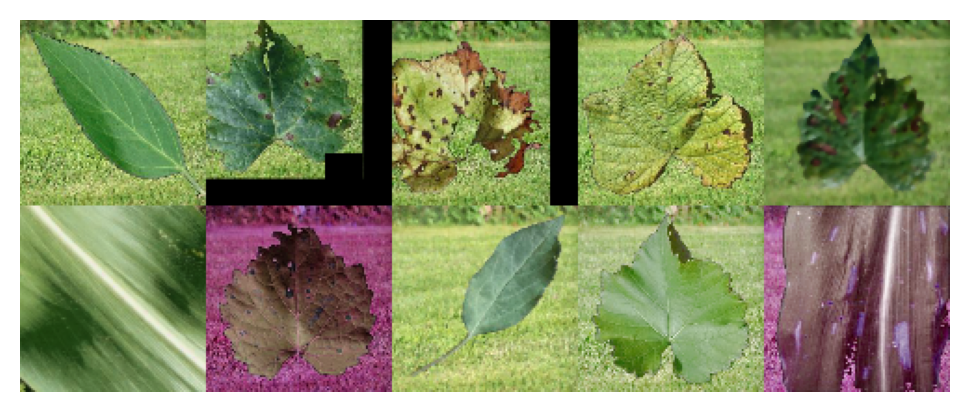

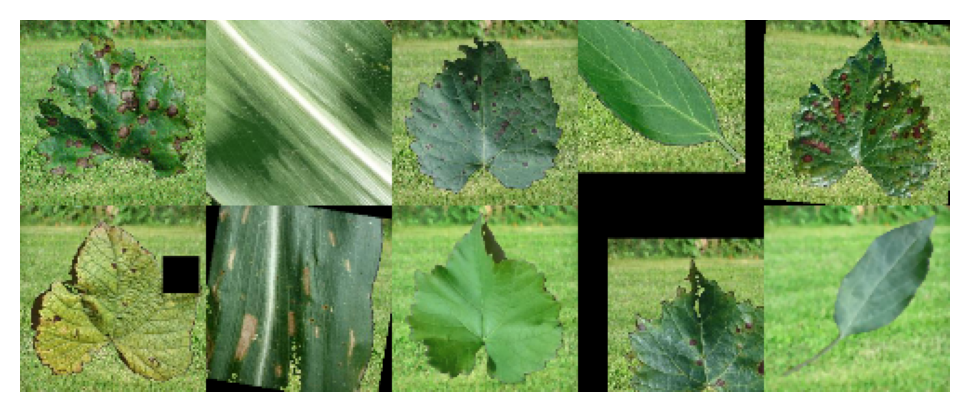

In [43]:
# -*- coding: utf-8 -*-
"""
Created on Tue Jul 26 13:58:01 2022

@author: talha
"""
#%%
from data_gen import GEN_DATA_LISTS, Data_Generator
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl 
import imgviz
import time

mpl.rcParams['figure.dpi'] = 200

root_dir = 'C:/Users/talha/Desktop/vit/data/' 
file_dirname = 'images/'
mask_dirname = None#'masks/'
labels = 'from_dirname'
Epoch = 3
batch_size = 4
prefetch_buffer = batch_size * 4

gdl = GEN_DATA_LISTS(root_dir, file_dirname, mask_dirname, labels)
train_paths, val_paths, test_paths  = gdl.get_splits()
all_classes = gdl.get_classes()
num_class = len(all_classes)

# for easy example only take 12 sample in the data gen
val_paths = val_paths[0:12]

BUFFER_SIZE = len(val_paths)

val_gen = Data_Generator(val_paths, all_classes, labels, batch_size, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)

#x, y = val_gen.__getitem__(np.random.randint(0,10))
all_imgs = []
for i in range(len(val_gen)):
    x, y = val_gen.__getitem__(i)
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))


plt.figure()
plt.imshow(imgviz.tile(all_imgs, shape=(2,5)))
plt.axis('off')

print('on_epoch_end called')
val_gen.on_epoch_end()

all_imgs = []
for i in range(len(val_gen)):
    x, y = val_gen.__getitem__(i)
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

plt.figure()
plt.imshow(imgviz.tile(all_imgs, shape=(2,5)))
plt.axis('off')

Noise AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG

 Shuffling Data...
0 [11 13 12 14]
1 [ 6 10  3 11]
2 [11  9  4 13]
3 [14 12  6  9]
4 [13  3 13 11]
5 [11 10  4 11]
6 [10 14  9 11]
7 [12  3 11  4]
8 [13  6 13 11]


(-0.5, 499.5, 199.5, -0.5)

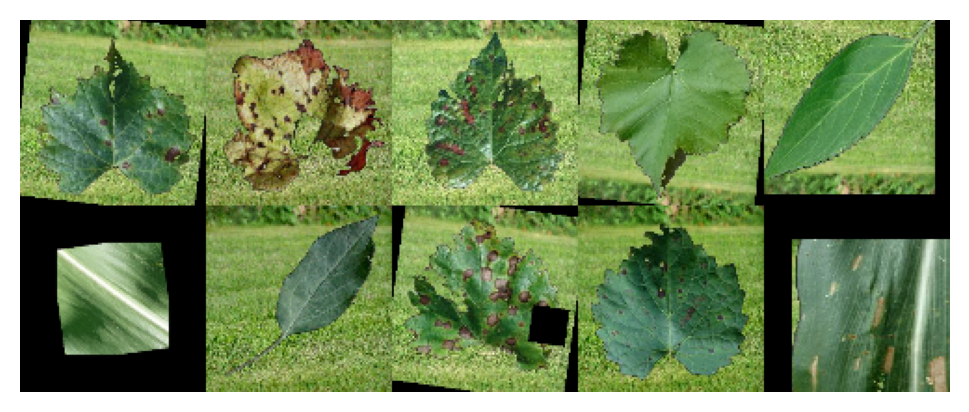

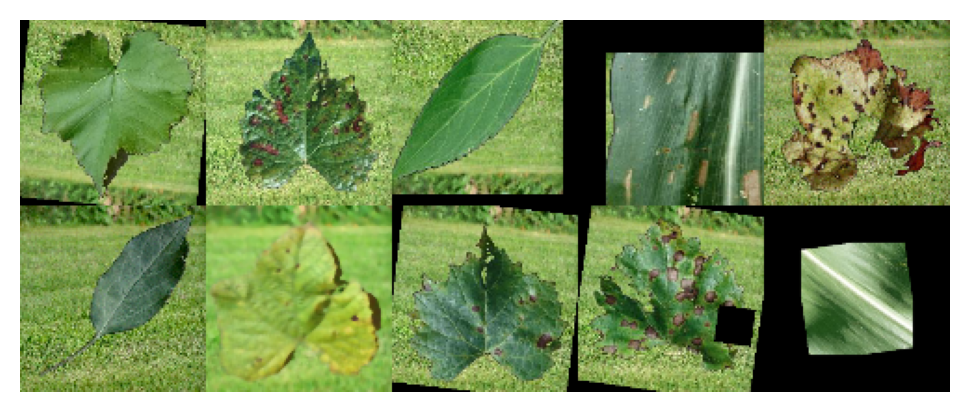

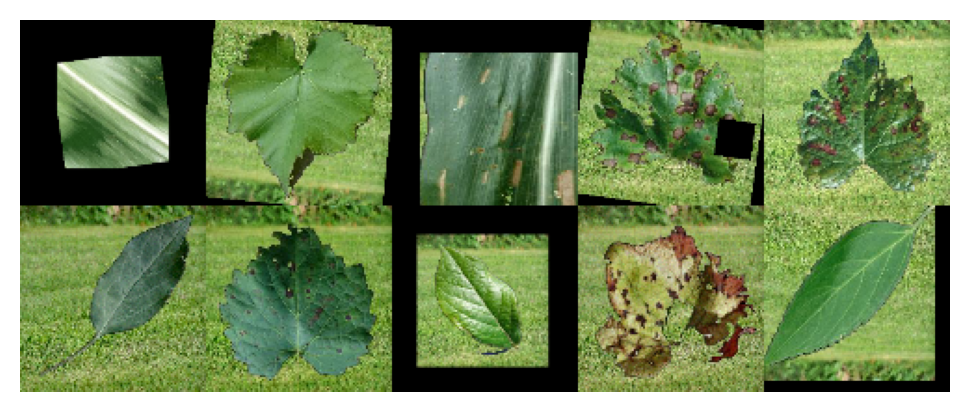

In [44]:
'''
Here we are using the cache followed by shuffle. So cache will produce exactly the same elements during each iteration through the dataset. 
Even though we already have shuffle implementd in our sequence class.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      .cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      .shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      .prefetch(prefetch_buffer)
      
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)

ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

a, b,c = np.array_split(all_imgs, Epoch)

plt.figure()
plt.imshow(imgviz.tile(list(a), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(b), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(c), shape=(2,5)))
plt.axis('off')

Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
0 [ 4 11 11 12]
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
1 [11  3  6 13]
Noise AUG
Geomatric AUG
Noise AUG
Noise AUG

 Shuffling Data...
2 [10  9 14 13]
3 [ 4 11 11 12]
4 [11  3  6 13]
5 [10  9 14 13]
6 [ 4 11 11 12]
7 [11  3  6 13]
8 [10  9 14 13]


(-0.5, 499.5, 199.5, -0.5)

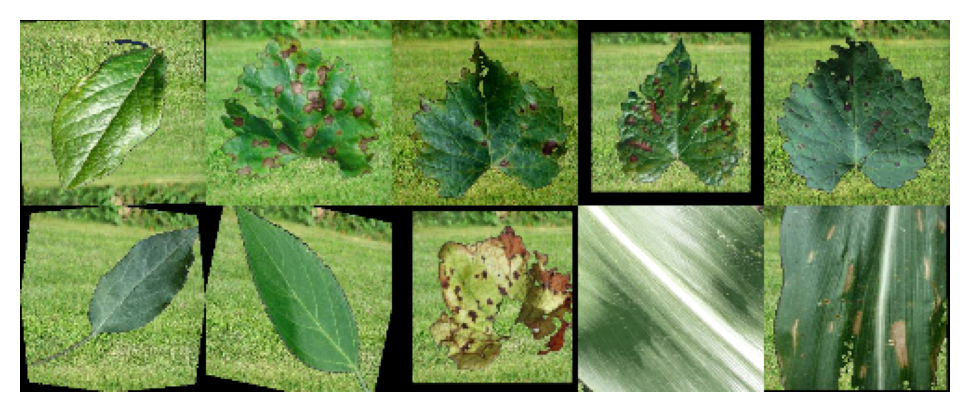

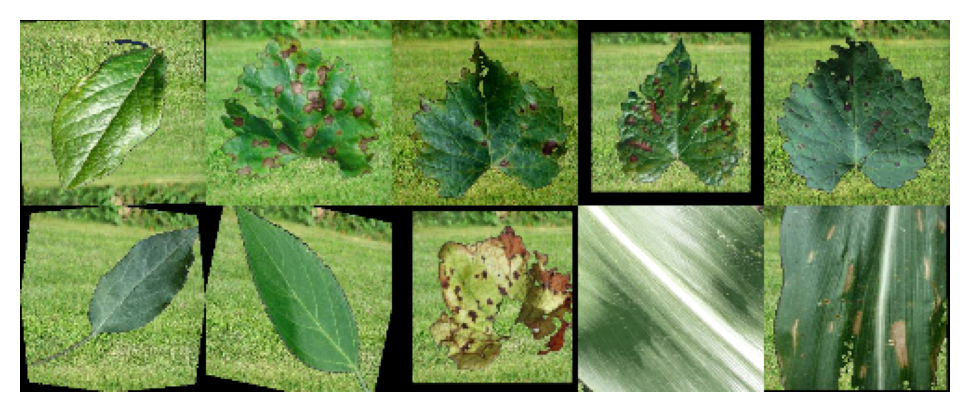

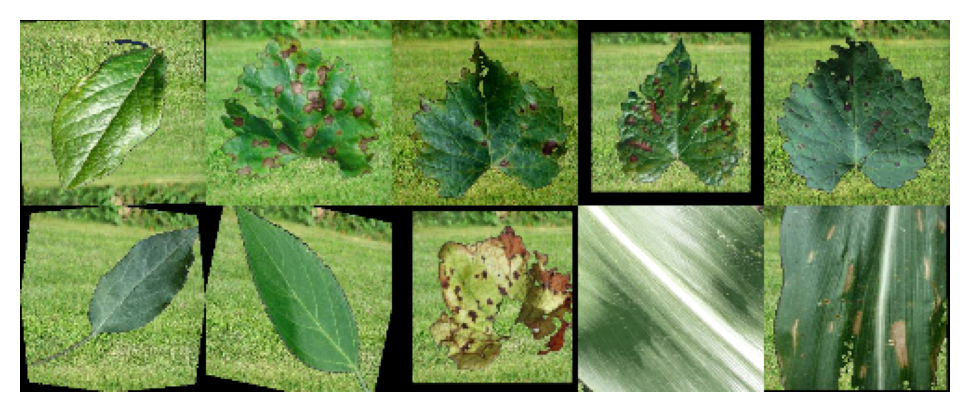

In [45]:
'''
Here we will turn off the shuffle even when we are using the cache so now model will same series of sample in each iteration.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      .cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      #.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      .prefetch(prefetch_buffer)
      
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)

ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

a, b,c = np.array_split(all_imgs, Epoch)

plt.figure()
plt.imshow(imgviz.tile(list(a), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(b), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(c), shape=(2,5)))
plt.axis('off')

Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG

 Shuffling Data...
0 [12 11 14  3]
1 [ 4 11 10  6]
2 [11  9 13 13]
Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG

 Shuffling Data...
3 [11 10 11 14]
4 [12  6  9 13]
5 [ 4 11  3 13]
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG

 Shuffling Data...
6 [12 13 14 10]
7 [ 6  4 11  3]
8 [11 13 11  9]


(-0.5, 499.5, 199.5, -0.5)

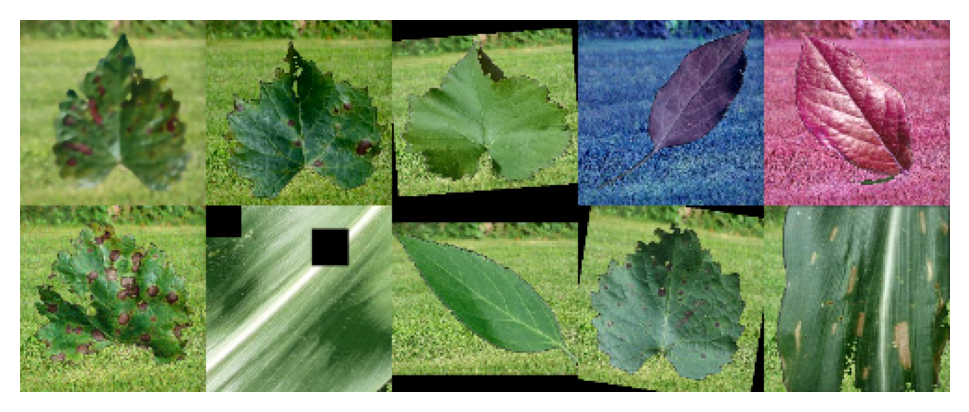

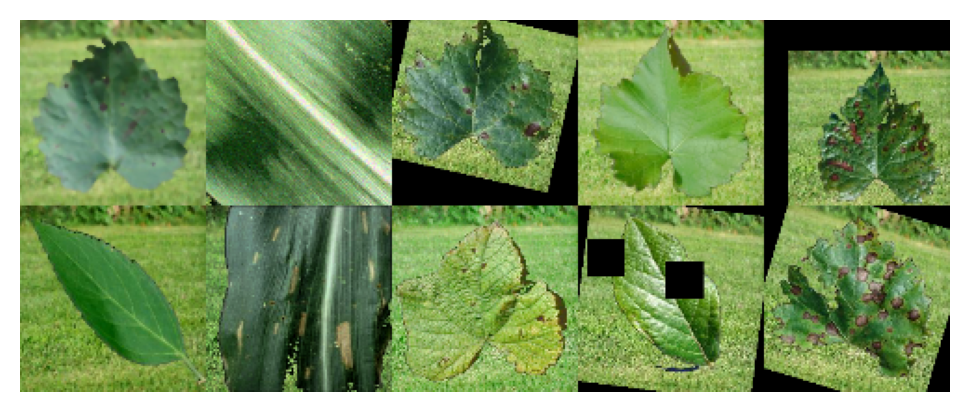

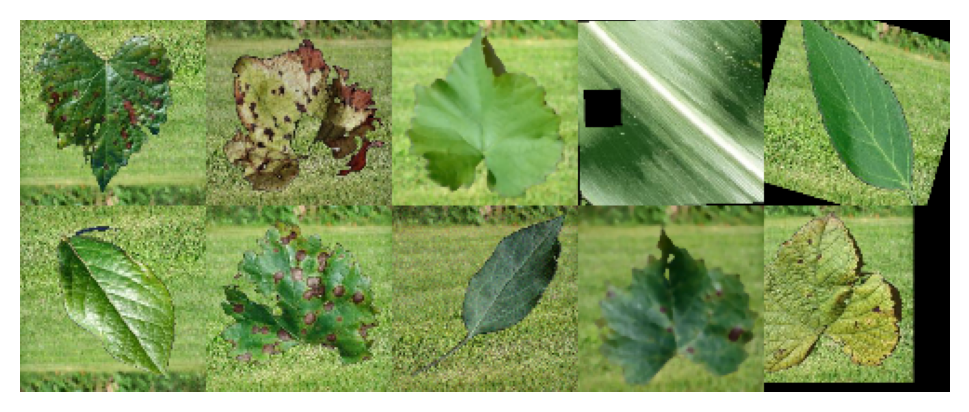

In [46]:
'''
Here we will turn off the cache so that each iteration gets new augmented samples form the dataset.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      #.cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      .shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      .prefetch(prefetch_buffer)
      
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)

ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

a, b,c = np.array_split(all_imgs, Epoch)

plt.figure()
plt.imshow(imgviz.tile(list(a), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(b), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(c), shape=(2,5)))
plt.axis('off')

Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG

 Shuffling Data...
0 [10  3 13 11]
1 [11 11  4 12]
2 [13  9  6 14]
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG
Noise AUG

 Shuffling Data...
3 [10  9 13  4]
4 [11 12 11 11]
5 [ 3 13 14  6]
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG

 Shuffling Data...
6 [ 4 13  6 11]
7 [ 9 11 14 13]
8 [10 12  3 11]
Time taken :  0.37847375869750977


(-0.5, 499.5, 199.5, -0.5)

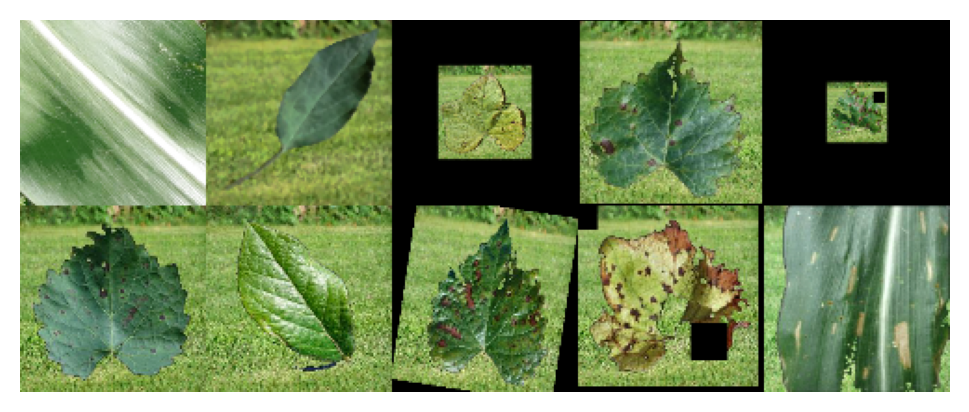

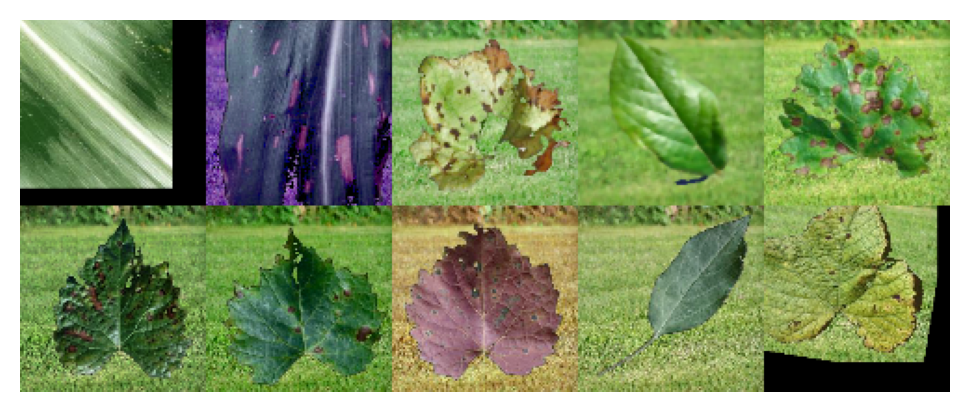

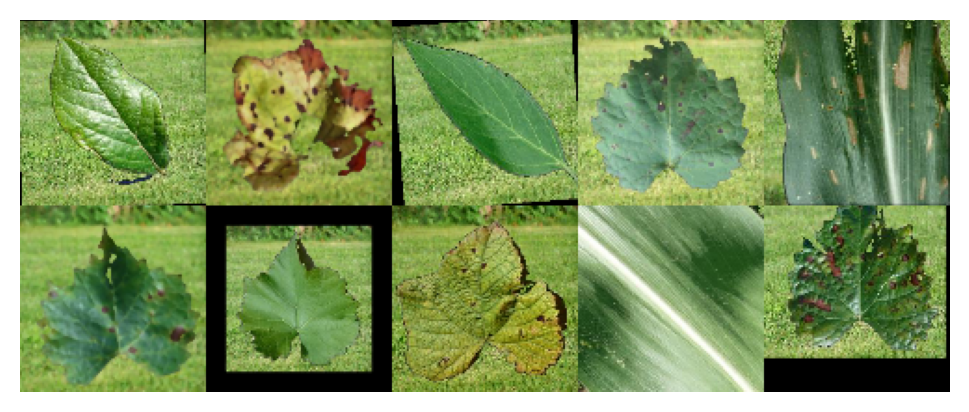

In [47]:
'''
Now turn OFF both cache and shuffle and we'll see that we observe the same performance as the very first classical data read.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      #.cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      .shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      #.prefetch(prefetch_buffer)
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)

ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

s = time.time()
all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

print('Time taken : ', time.time()-s)

a, b,c = np.array_split(all_imgs, Epoch)

plt.figure()
plt.imshow(imgviz.tile(list(a), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(b), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(c), shape=(2,5)))
plt.axis('off')

Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG

 Shuffling Data...
0 [11 11 13  6]
1 [14 10 13  4]
Geomatric AUG
2 [ 9  3 11 12]
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG

 Shuffling Data...
3 [11 13  6 12]
Geomatric AUG
4 [ 4  9  3 11]
5 [10 11 13 14]
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG

 Shuffling Data...
6 [12  4  6 11]
7 [11  3 10  9]
8 [11 13 13 14]
Time taken :  0.4380033016204834


(-0.5, 499.5, 199.5, -0.5)

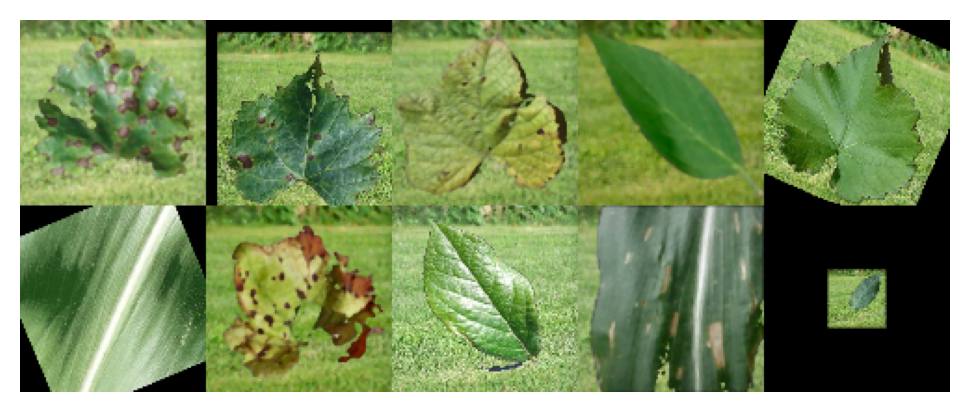

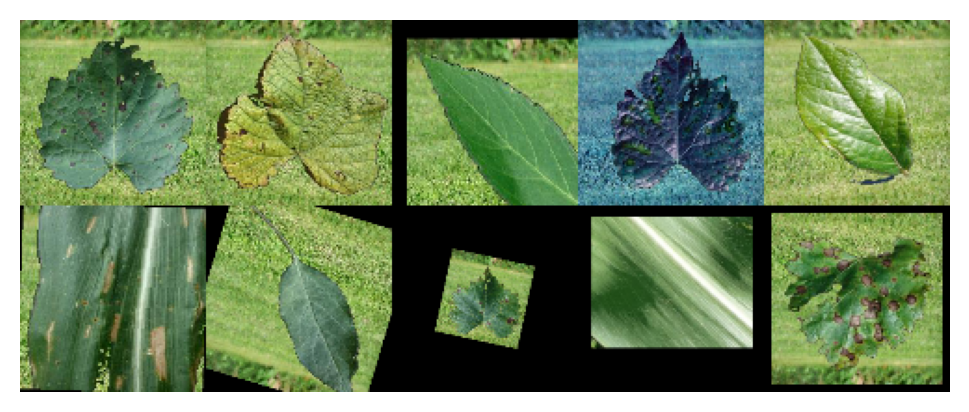

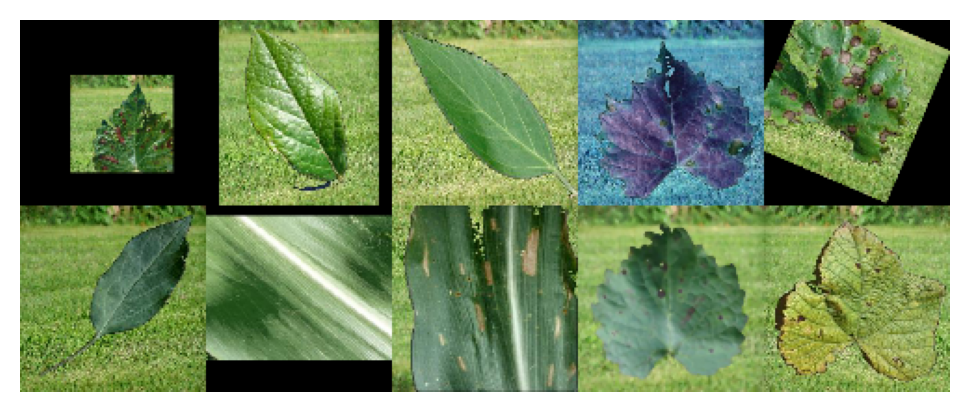

In [48]:
'''
Now turn on the prefetech to observe the speed up.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      #.cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      .shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      .prefetch(prefetch_buffer)
      
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)
s = time.time()
ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

print('Time taken : ', time.time()-s)

a, b,c = np.array_split(all_imgs, Epoch)

plt.figure()
plt.imshow(imgviz.tile(list(a), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(b), shape=(2,5)))
plt.axis('off')

plt.figure()
plt.imshow(imgviz.tile(list(c), shape=(2,5)))
plt.axis('off')

In [49]:
'''
Now turn on the prefetech with tf AUTO TUNE to observe the speed up.
'''
def TFDS(ds, BATCH_SIZE, BUFFER_SIZE):
    ds = tf.data.Dataset.from_generator(ds,
                                        # output_types = (tf.float32, tf.float32),
                                        # output_shapes = (tf.TensorShape([224,224,3]),
                                        #                   tf.TensorShape([38])),
                                        output_signature=(tf.TensorSpec(shape=(100,100,3) , dtype=tf.float32),
                                                          tf.TensorSpec(shape=(38) , dtype=tf.float32))
                                        )
                                           
    return (
      ds
      #.cache()#filename='/home/user01/data/talha/crop_weed_clf/cache/')
      .shuffle(BUFFER_SIZE, reshuffle_each_iteration=True)
      .batch(BATCH_SIZE)
      #.map(rois, num_parallel_calls=tf.data.AUTOTUNE)
      #.filter(filter_max)
      .repeat(Epoch)
      .prefetch(tf.data.AUTOTUNE)
      
      )

val_gen = Data_Generator(val_paths, all_classes, labels, 1, 100, 100, 
                         255, 0.1, data_augment=True, shuffle=True)
s = time.time()
ds  = TFDS(val_gen, batch_size, BUFFER_SIZE)

all_imgs = []
for i, (x, y) in enumerate(ds.as_numpy_iterator()):
    x =((x+1)*127.5).astype(np.uint8)
    x = list(x)
    for j in x:
        all_imgs.append(j)
    print(i, np.argmax(y, -1))

print('Time taken : ', time.time()-s)

a, b,c = np.array_split(all_imgs, Epoch)
# not plotting becuae only speed is effected in this case
# plt.figure()
# plt.imshow(imgviz.tile(list(a), shape=(2,5)))
# plt.axis('off')

# plt.figure()
# plt.imshow(imgviz.tile(list(b), shape=(2,5)))
# plt.axis('off')

# plt.figure()
# plt.imshow(imgviz.tile(list(c), shape=(2,5)))
# plt.axis('off')

Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG

 Shuffling Data...
0 [11 10 12 11]
1 [ 3 11 13  9]
2 [13 14  6  4]
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG

 Shuffling Data...
3 [ 9 13 10 14]
4 [11 12 11  6]
5 [ 4 13  3 11]
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Geomatric AUG
Geomatric AUG
Geomatric AUG
Noise AUG
Noise AUG
Geomatric AUG
Noise AUG

 Shuffling Data...
6 [14  3 11 10]
7 [11 12  6  4]
8 [13  9 11 13]
Time taken :  0.5124986171722412
